# Diabetes: EDA and Prediction

The target variable is specified as *Outcome* of a diabetes test, where 1 indicates a positive result and 0 indicates a negative result.

The dataset consists of the following columns:
- Pregnancies: Number of pregnancies
- Glucose: 2-hour plasma glucose concentration in oral glucose tolerance test
- Blood Pressure: Blood Pressure (mm Hg)
- SkinThickness: Skin Thickness
- Insulin: 2-hour serum insulin (mu U/ml)
- DiabetesPedigreeFunction: Function (2-hour plasma glucose concentration in oral glucose tolerance test)
- BMI: Body mass index
- Age: Age (years)
- Outcome: Have diabetes (1) or not (0)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import itertools
import plotly.graph_objects as go

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.impute import KNNImputer

import warnings
warnings.simplefilter(action="ignore")

In [2]:
df = pd.read_csv("./dataset/diabetes.csv")

In [3]:
def check_df(dataframe, head=5):
    print("-----Shape-----")
    print(dataframe.shape)
    print("----- Types -----")
    print(dataframe.dtypes)
    print("----- Head -----")
    print(dataframe.head(head))
    print("----- Null -----")
    print(dataframe.isnull().sum())

check_df(df)

-----Shape-----
(768, 9)
----- Types -----
Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object
----- Head -----
   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0            6      148             72             35        0  33.6   
1            1       85             66             29        0  26.6   
2            8      183             64              0        0  23.3   
3            1       89             66             23       94  28.1   
4            0      137             40             35      168  43.1   

   DiabetesPedigreeFunction  Age  Outcome  
0                     0.627   50        1  
1                     0.351   31        0  
2                     0.672   32     

In [4]:
traget_col = ['Outcome']
expl_col = [col for col in df.columns if col != 'Outcome']

## Target Variable Analysis

   Outcome      Ratio
0      500  65.104167
1      268  34.895833


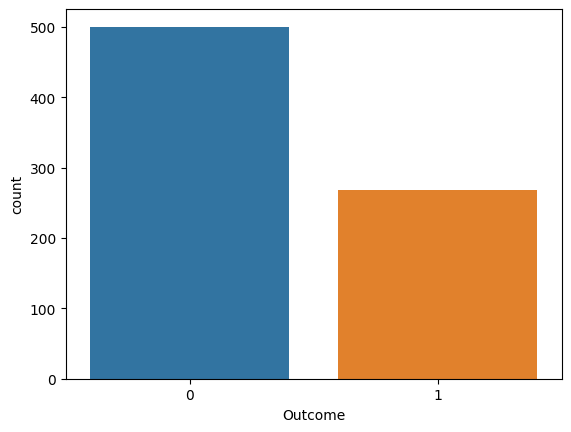

In [5]:
print(pd.DataFrame({'Outcome': df['Outcome'].value_counts(), "Ratio": 100 * df['Outcome'].value_counts() / len(df)}))
sns.countplot(x=df['Outcome'], data=df)
plt.show()

## Explanatory Variables Analysis

### Pregnancies

count    768.000000
mean       3.845052
std        3.369578
min        0.000000
25%        1.000000
50%        3.000000
75%        6.000000
max       17.000000
Name: Pregnancies, dtype: float64


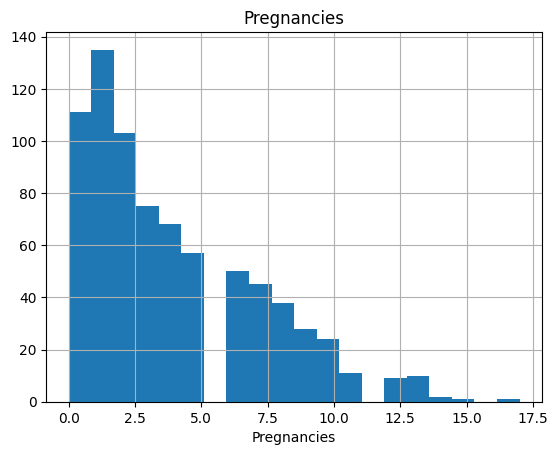

In [6]:
print(df['Pregnancies'].describe())
df['Pregnancies'].hist(bins=20)
plt.xlabel('Pregnancies')
plt.title('Pregnancies')
plt.show()

### Glucose

count    768.000000
mean     120.894531
std       31.972618
min        0.000000
25%       99.000000
50%      117.000000
75%      140.250000
max      199.000000
Name: Glucose, dtype: float64


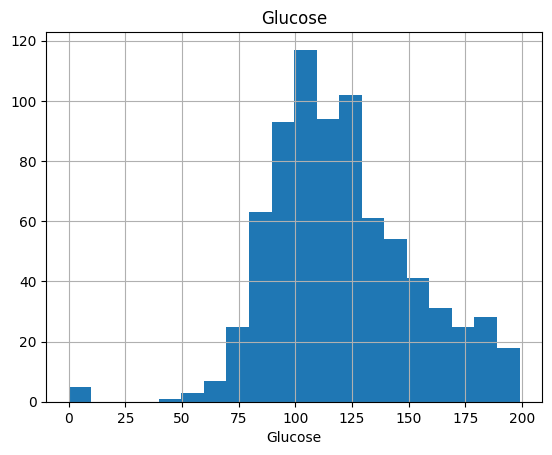

In [7]:
print(df['Glucose'].describe())
df['Glucose'].hist(bins=20)
plt.xlabel('Glucose')
plt.title('Glucose')
plt.show()

### Blood Pressure

count    768.000000
mean      69.105469
std       19.355807
min        0.000000
25%       62.000000
50%       72.000000
75%       80.000000
max      122.000000
Name: BloodPressure, dtype: float64


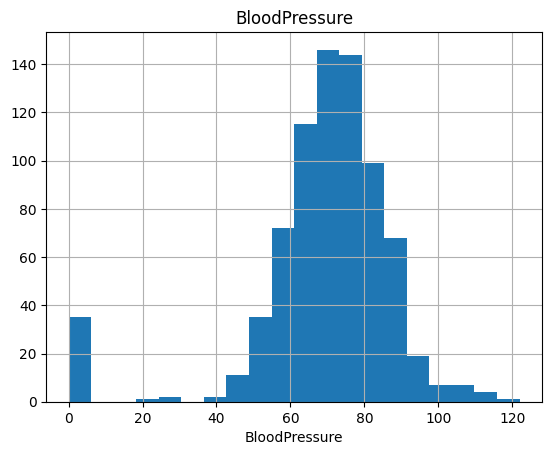

In [8]:
print(df['BloodPressure'].describe())
df['BloodPressure'].hist(bins=20)
plt.xlabel('BloodPressure')
plt.title('BloodPressure')
plt.show()

### Skin Thickness

count    768.000000
mean      20.536458
std       15.952218
min        0.000000
25%        0.000000
50%       23.000000
75%       32.000000
max       99.000000
Name: SkinThickness, dtype: float64


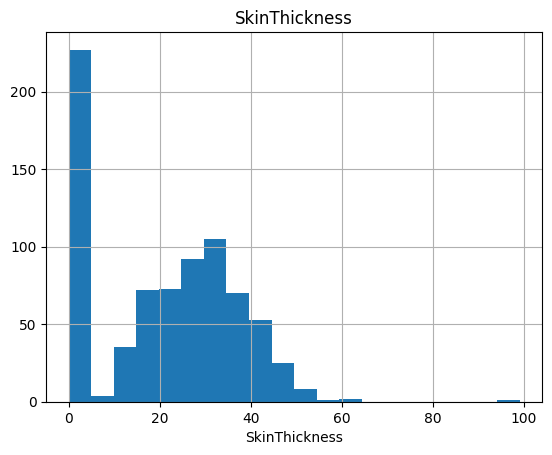

In [9]:
print(df['SkinThickness'].describe())
df['SkinThickness'].hist(bins=20)
plt.xlabel('SkinThickness')
plt.title('SkinThickness')
plt.show()

### Insulin

count    768.000000
mean      79.799479
std      115.244002
min        0.000000
25%        0.000000
50%       30.500000
75%      127.250000
max      846.000000
Name: Insulin, dtype: float64


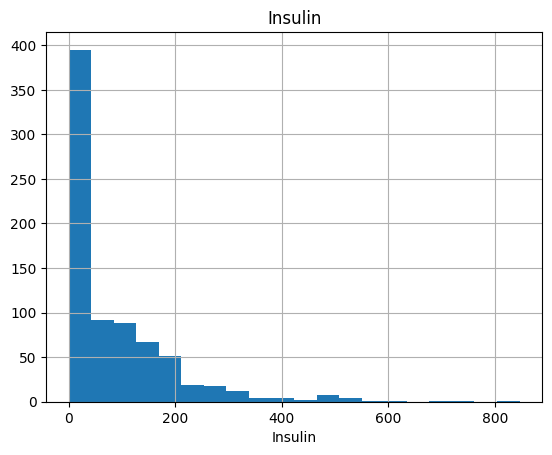

In [10]:
print(df['Insulin'].describe())
df['Insulin'].hist(bins=20)
plt.xlabel('Insulin')
plt.title('Insulin')
plt.show()

### BMI

count    768.000000
mean      31.992578
std        7.884160
min        0.000000
25%       27.300000
50%       32.000000
75%       36.600000
max       67.100000
Name: BMI, dtype: float64


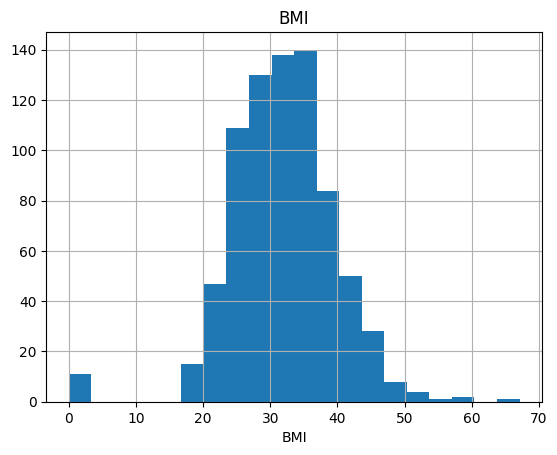

In [11]:
print(df['BMI'].describe())
df['BMI'].hist(bins=20)
plt.xlabel('BMI')
plt.title('BMI')
plt.show()

### Diabetes Pedigree Function

count    768.000000
mean       0.471876
std        0.331329
min        0.078000
25%        0.243750
50%        0.372500
75%        0.626250
max        2.420000
Name: DiabetesPedigreeFunction, dtype: float64


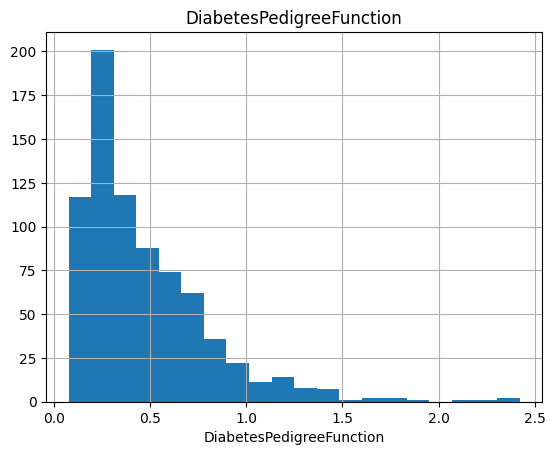

In [12]:
print(df['DiabetesPedigreeFunction'].describe())
df['DiabetesPedigreeFunction'].hist(bins=20)
plt.xlabel('DiabetesPedigreeFunction')
plt.title('DiabetesPedigreeFunction')
plt.show()

### Age

count    768.000000
mean      33.240885
std       11.760232
min       21.000000
25%       24.000000
50%       29.000000
75%       41.000000
max       81.000000
Name: Age, dtype: float64


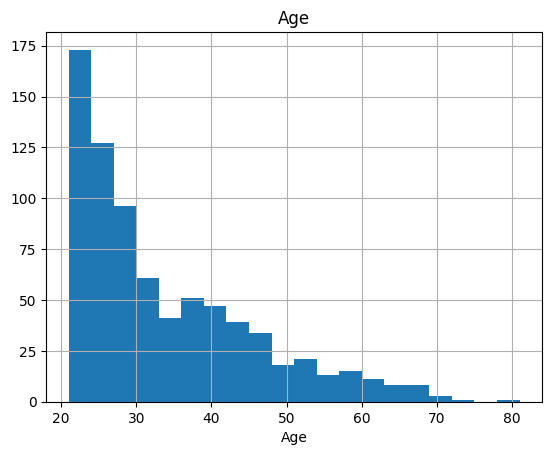

In [13]:
print(df['Age'].describe())
df['Age'].hist(bins=20)
plt.xlabel('Age')
plt.title('Age')
plt.show()

## Analysis of Explanatory Variables by Target Variable

         Pregnancies_mean
Outcome                  
0                3.298000
1                4.865672



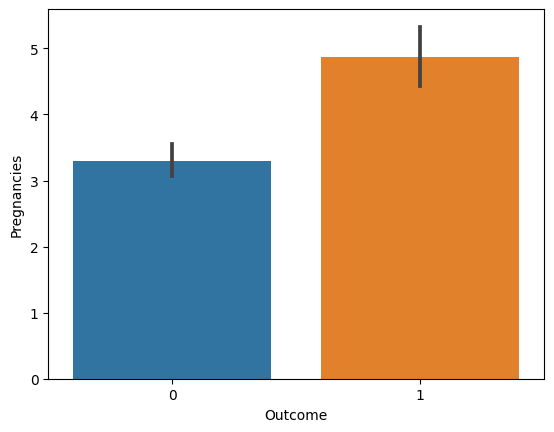

         Glucose_mean
Outcome              
0          109.980000
1          141.257463



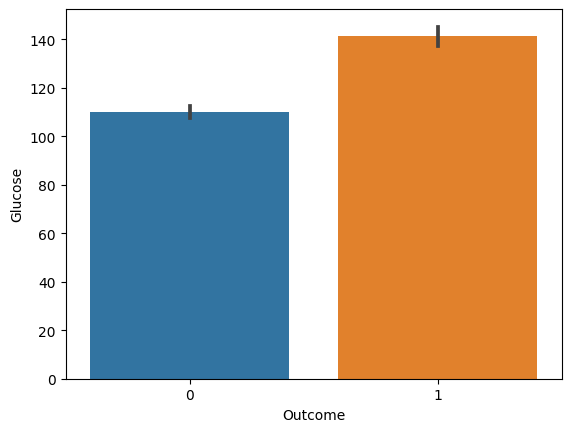

         BloodPressure_mean
Outcome                    
0                 68.184000
1                 70.824627



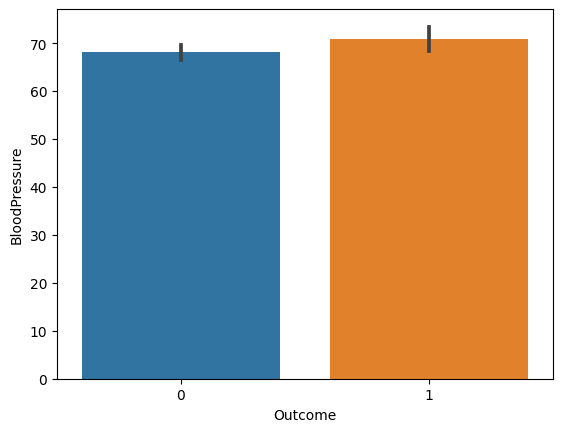

         SkinThickness_mean
Outcome                    
0                 19.664000
1                 22.164179



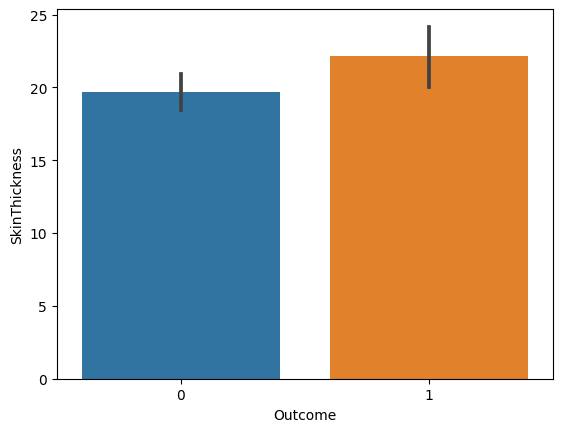

         Insulin_mean
Outcome              
0           68.792000
1          100.335821



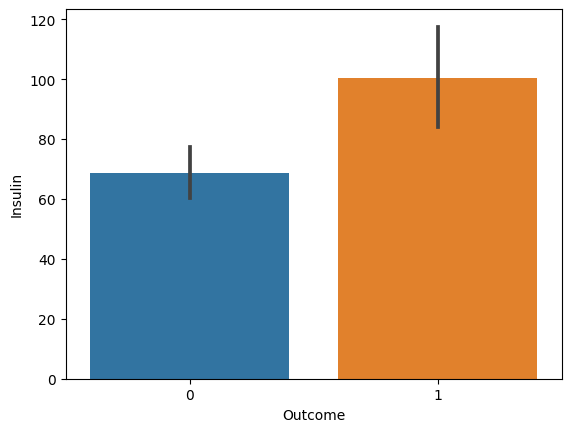

          BMI_mean
Outcome           
0        30.304200
1        35.142537



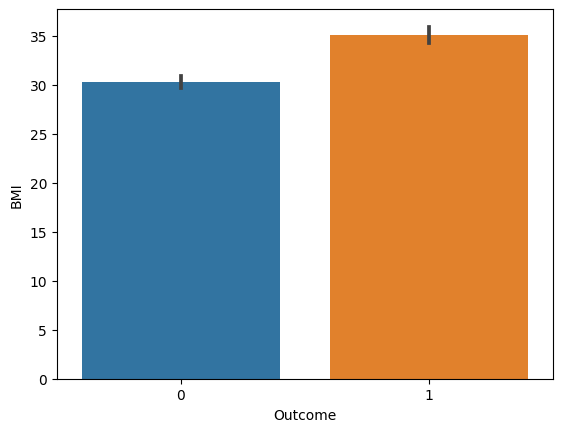

         DiabetesPedigreeFunction_mean
Outcome                               
0                             0.429734
1                             0.550500



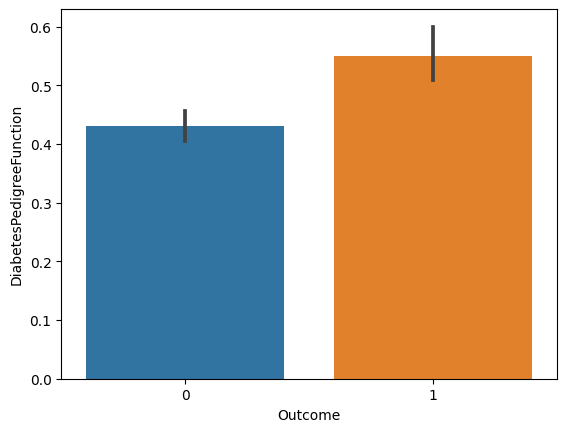

          Age_mean
Outcome           
0        31.190000
1        37.067164



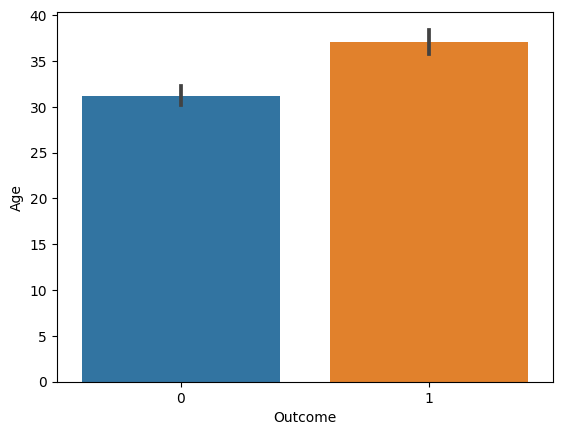

In [14]:
for col in expl_col:
    print(pd.DataFrame({col+'_mean': df.groupby('Outcome')[col].mean()}), end='\n\n')
    sns.barplot(x='Outcome', y=col, data=df)
    plt.show()

## Variable Correlation Analysis

In [15]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [16]:
corr = df[expl_col].corr()
corr

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Pregnancies,1.000,0.129,0.141,-0.082,-0.074,0.018,-0.034,0.544
Glucose,0.129,1.000,0.153,0.057,0.331,0.221,0.137,0.264
BloodPressure,0.141,0.153,1.000,0.207,0.089,0.282,0.041,0.240
SkinThickness,-0.082,0.057,0.207,1.000,0.437,0.393,0.184,-0.114
Insulin,-0.074,0.331,0.089,0.437,1.000,0.198,0.185,-0.042
BMI,0.018,0.221,0.282,0.393,0.198,1.000,0.141,0.036
DiabetesPedigreeFunction,-0.034,0.137,0.041,0.184,0.185,0.141,1.000,0.034
Age,0.544,0.264,0.240,-0.114,-0.042,0.036,0.034,1.000


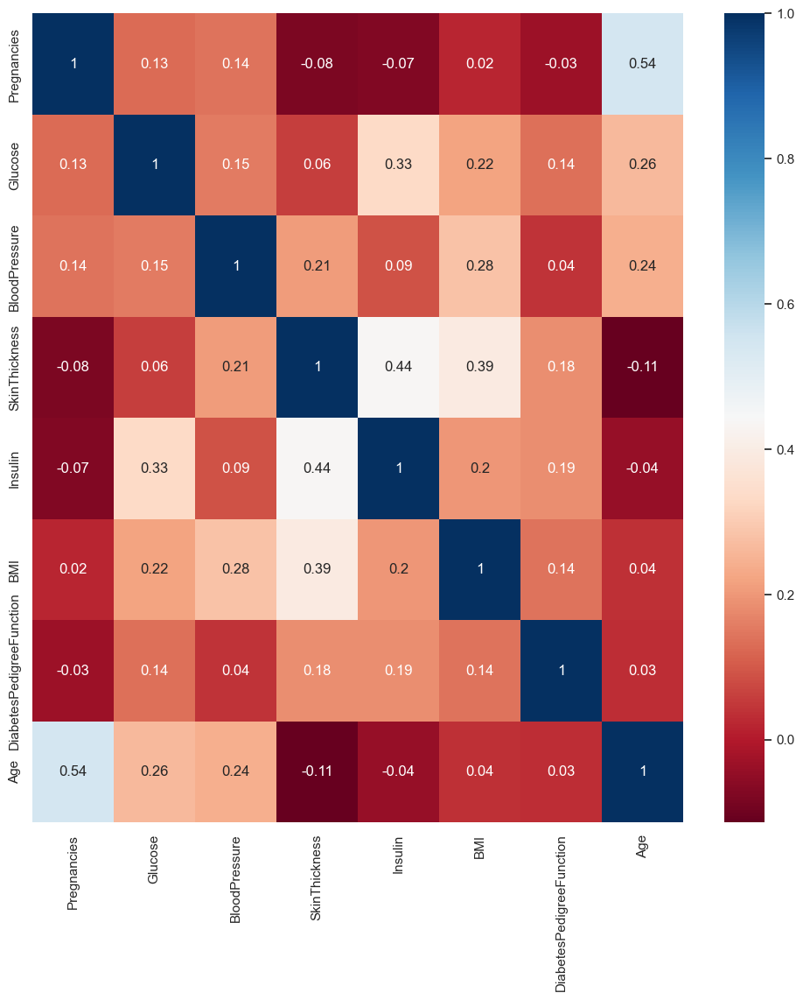

In [17]:
sns.set(rc={"figure.figsize": (12, 12)})
corr_values = corr.round(2)
sns.heatmap(corr, cmap="RdBu", annot=corr_values)
plt.show()

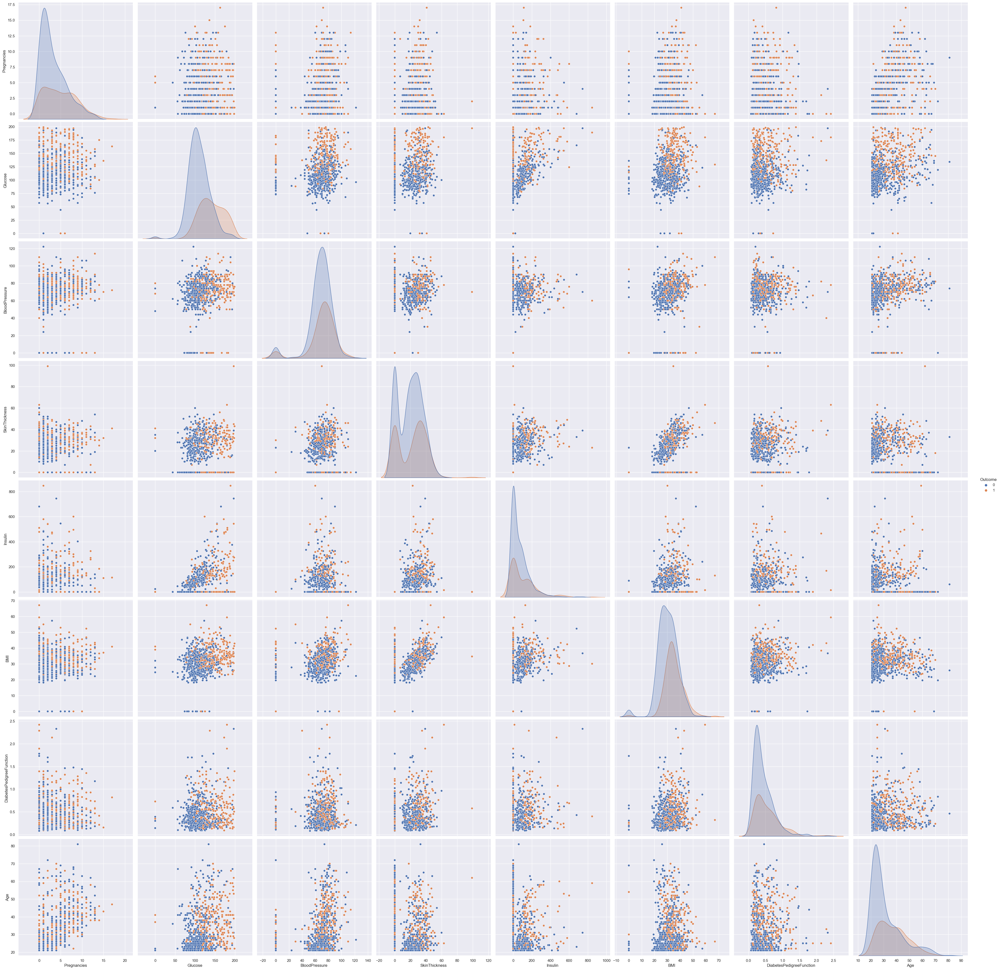

In [18]:
sns.pairplot(data=df, vars=expl_col, hue='Outcome', height=5)
plt.show()

## Building Model Prior Feature Engineering

We will be measuring the performance of each model by the following metrics:
- **Accuracy:** Accuracy represents the overall correctness rate of the model's predictions. It indicates the proportion of correctly classified cases out of the total data.
- **Recall:** Recall measures the proportion of actual diabetic cases that are correctly identified by the model. It shows how well the model captures the true positive cases of diabetes.
- **Precision:** Precision calculates the proportion of predicted diabetic cases that are actually true positive cases. It indicates the accuracy of the model's positive predictions for diabetes.
- **F1 Score:** F1 score is the harmonic mean of recall and precision. It provides a balanced measure by considering both recall and precision equally, evaluating the overall performance of the model.
- **AUC (Area Under the Curve):** AUC represents the area under the Receiver Operating Characteristic (ROC) curve. It reflects the model's ability to distinguish between classes and provides an overall measure of performance.

In [19]:
# Dependent/target variable
y = df["Outcome"]

# Independent/explanatory variables
X = df.drop("Outcome", axis=1)

# Splitting into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=5)

### Logistic Regression

In [20]:
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)

In [21]:
print("-----Logistic Regression-----")
print(f"Accuracy: {round(accuracy_score(lr_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(lr_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(lr_pred, y_test), 4)}")
print(f"F1: {round(f1_score(lr_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(lr_pred, y_test), 4)}")

-----Logistic Regression-----
Accuracy: 0.7857
Recall: 0.7234
Precision: 0.6296
F1: 0.6733
AUC: 0.7682


### K-Nearest Neighbors (KNN)

In [22]:
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)

In [23]:
print("-----K-Nearest Neighbors (KNN)-----")
print(f"Accuracy: {round(accuracy_score(knn_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(knn_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(knn_pred, y_test), 4)}")
print(f"F1: {round(f1_score(knn_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(knn_pred, y_test), 4)}")

-----K-Nearest Neighbors (KNN)-----
Accuracy: 0.7143
Recall: 0.6136
Precision: 0.5
F1: 0.551
AUC: 0.6841


### Decision Tree Classifier

In [24]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)

In [25]:
print("-----Decision Tree Classifier-----")
print(f"Accuracy: {round(accuracy_score(dt_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(dt_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(dt_pred, y_test), 4)}")
print(f"F1: {round(f1_score(dt_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(dt_pred, y_test), 4)}")

-----Decision Tree Classifier-----
Accuracy: 0.6688
Recall: 0.5273
Precision: 0.537
F1: 0.5321
AUC: 0.6374


|--- feature_1 <= 154.50
|   |--- feature_7 <= 28.50
|   |   |--- feature_5 <= 30.95
|   |   |   |--- class: 0
|   |   |--- feature_5 >  30.95
|   |   |   |--- class: 0
|   |--- feature_7 >  28.50
|   |   |--- feature_1 <= 94.50
|   |   |   |--- class: 0
|   |   |--- feature_1 >  94.50
|   |   |   |--- class: 0
|--- feature_1 >  154.50
|   |--- feature_7 <= 62.50
|   |   |--- feature_6 <= 0.31
|   |   |   |--- class: 1
|   |   |--- feature_6 >  0.31
|   |   |   |--- class: 1
|   |--- feature_7 >  62.50
|   |   |--- feature_2 <= 85.00
|   |   |   |--- class: 0
|   |   |--- feature_2 >  85.00
|   |   |   |--- class: 1



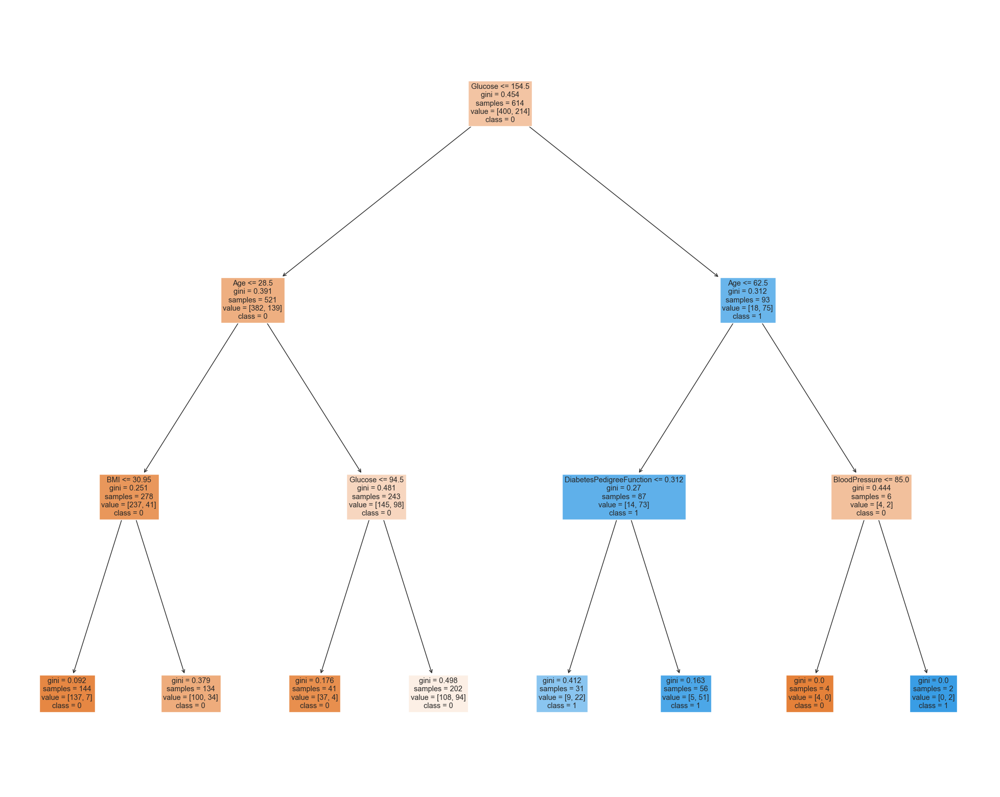

In [26]:
# Defining and training the Decision Tree Classifier
clf = DecisionTreeClassifier(max_depth=3)
clf = clf.fit(X_train, y_train)

# Making predictions on the test set
y_pred = clf.predict(X_test)

# Generating the text representation of the decision tree and printing it
text_representation = tree.export_text(clf)
print(text_representation)

target_names = ['0', '1']

# Generating and saving the visualization of the decision tree
fig = plt.figure(figsize=(25, 20))
plot = tree.plot_tree(clf, feature_names=expl_col, class_names=target_names, filled=True)

### Random Forest Classifier

In [27]:
rf_model = RandomForestClassifier(random_state=100).fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

In [28]:
print("-----RandomForestClassifier-----")
print(f"Accuracy: {round(accuracy_score(y_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(y_pred,y_test),4)}")
print(f"Precision: {round(precision_score(y_pred,y_test), 4)}")
print(f"F1: {round(f1_score(y_pred,y_test), 4)}")
print(f"Auc: {round(roc_auc_score(y_pred,y_test), 4)}")

-----RandomForestClassifier-----
Accuracy: 0.7792
Recall: 0.7
Precision: 0.6481
F1: 0.6731
Auc: 0.7587


### Support Vecor Classifier (SVC)

In [29]:
svc_model = SVC()
svc_model.fit(X_train, y_train)
svc_pred = svc_model.predict(X_test)

In [30]:
print("-----Support Vector Classifier (SVC)-----")
print(f"Accuracy: {round(accuracy_score(svc_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(svc_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(svc_pred, y_test), 4)}")
print(f"F1: {round(f1_score(svc_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(svc_pred, y_test), 4)}")

-----Support Vector Classifier (SVC)-----
Accuracy: 0.7532
Recall: 0.7105
Precision: 0.5
F1: 0.587
AUC: 0.7389


### Variable Importance for Decision Tree and Random Forest Model

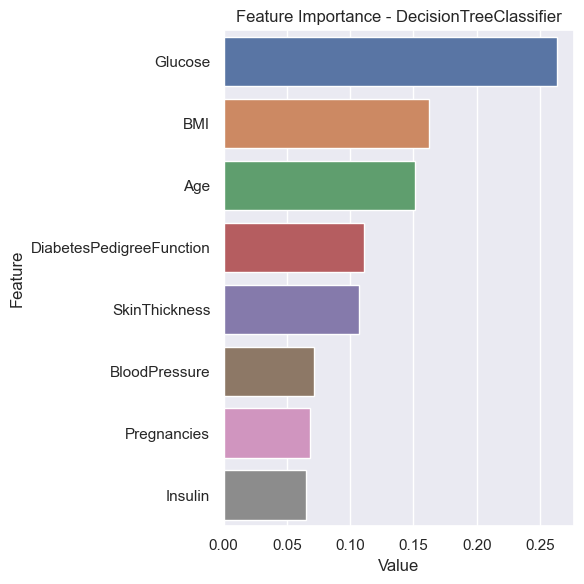

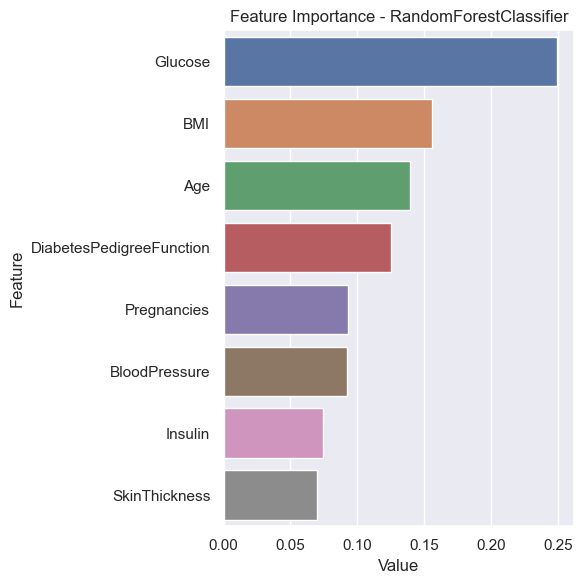

In [31]:
model_names = [dt_model,rf_model]

for model in model_names:
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': X.columns})
    plt.figure(figsize=(6, 6))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:len(X)])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show()

## Feature Engineering

### Missing Values Exploration

In [32]:
# Variables with missing observations filled with zero in the data set.

zero_colunms = [col for col in df.columns if (df[col].min() == 0 and col not in  ["Pregnancies", "Outcome"])]
zero_colunms

['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

In [33]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [34]:
for col in zero_colunms:
    df[col] = np.where(df[col] == 0, np.nan, df[col])

In [35]:
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [36]:
na_columns = [col for col in df.columns if df[col].isnull().sum() > 0]
num_miss = df[na_columns].isnull().sum().sort_values(ascending=False)
ratio = (df[na_columns].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
missing_df = pd.concat([num_miss, np.round(ratio, 2)], axis=1, keys=['num_miss', 'ratio'])
print(missing_df, end="\n")

               num_miss  ratio
Insulin             374 48.700
SkinThickness       227 29.560
BloodPressure        35  4.560
BMI                  11  1.430
Glucose               5  0.650


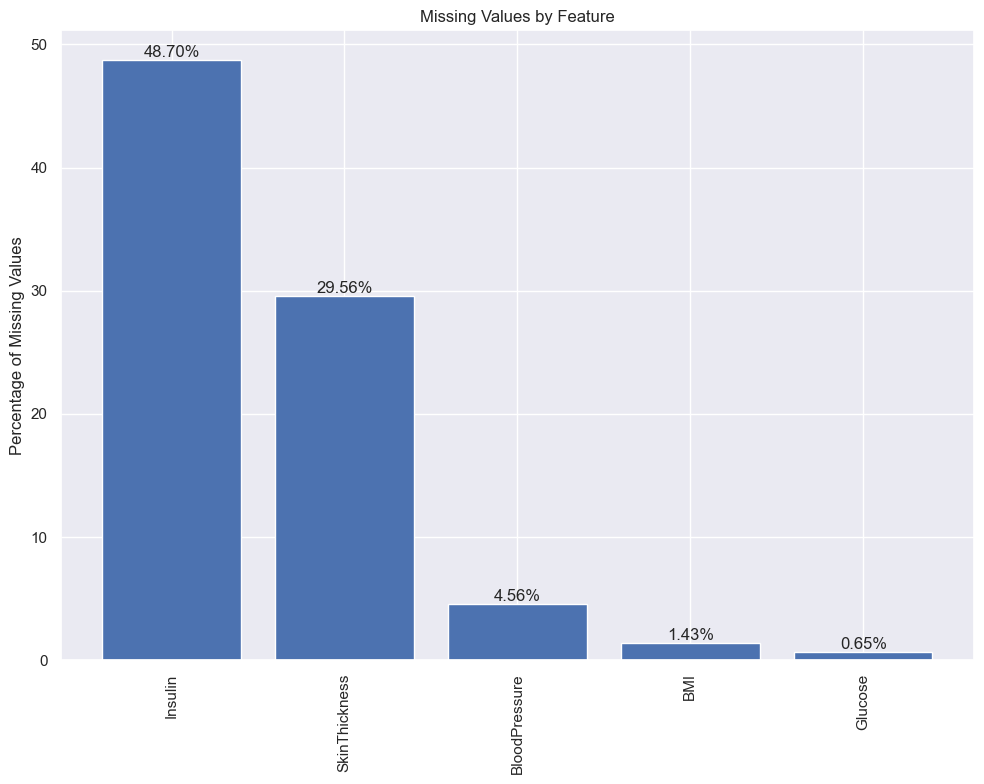

In [37]:
# Plotting the missing values
plt.figure(figsize=(10, 8))
bars = plt.bar(missing_df.index, missing_df['ratio'])

plt.ylabel('Percentage of Missing Values')
plt.title('Missing Values by Feature')
        
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}%', ha='center', va='bottom')
        
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Filling Missing Values: KNN Imputers

In [38]:
dff = df[na_columns]
dff.head()

,Glucose,BloodPressure,SkinThickness,Insulin,BMI
0,148.000,72.000,35.000,NaN,33.600
1,85.000,66.000,29.000,NaN,26.600
2,183.000,64.000,NaN,NaN,23.300
3,89.000,66.000,23.000,94.000,28.100
4,137.000,40.000,35.000,168.000,43.100


In [39]:
rs = RobustScaler()

In [40]:
dff = pd.DataFrame(rs.fit_transform(dff), columns=dff.columns)
dff.head()

,Glucose,BloodPressure,SkinThickness,Insulin,BMI
0,0.738,0.000,0.429,NaN,0.143
1,-0.762,-0.375,0.000,NaN,-0.626
2,1.571,-0.500,NaN,NaN,-0.989
3,-0.667,-0.375,-0.429,-0.273,-0.462
4,0.476,-2.000,0.429,0.378,1.187


In [41]:
# Adjusting the number of neighbors
dff = pd.DataFrame(KNNImputer(n_neighbors=5).fit_transform(dff), columns = dff.columns)

In [42]:
dff.head()

,Glucose,BloodPressure,SkinThickness,Insulin,BMI
0,0.738,0.000,0.429,0.624,0.143
1,-0.762,-0.375,0.000,-0.452,-0.626
2,1.571,-0.500,-0.243,0.819,-0.989
3,-0.667,-0.375,-0.429,-0.273,-0.462
4,0.476,-2.000,0.429,0.378,1.187


In [43]:
dff = pd.DataFrame(rs.inverse_transform(dff), columns=dff.columns)

In [44]:
df[na_columns] = dff
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.000,72.000,35.000,196.000,33.600,0.627,50,1
1,1,85.000,66.000,29.000,73.600,26.600,0.351,31,0
2,8,183.000,64.000,25.600,218.200,23.300,0.672,32,1
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1
5,5,116.000,74.000,24.200,85.000,25.600,0.201,30,0
6,3,78.000,50.000,32.000,88.000,31.000,0.248,26,1
7,10,115.000,69.400,36.600,123.200,35.300,0.134,29,0
8,2,197.000,70.000,45.000,543.000,30.500,0.158,53,1
9,8,125.000,96.000,40.200,163.600,31.100,0.232,54,1


In [45]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

### Outlier Exploration

In [46]:
def thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [47]:
def replace_with_thresholds(dataframe, variable, q1=0.05, q3=0.95):
    low_limit, up_limit = thresholds(dataframe, variable, q1=0.05, q3=0.95)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [48]:
def check_outlier(dataframe, col_name, plot=False):
    low_limit, up_limit = thresholds(dataframe, col_name)
    outliers = dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)]
    if outliers.any(axis=None):
        if plot:
            plt.figure(figsize=(8, 6))
            sns.boxplot(x=dataframe[col_name])
            plt.title(f'Outliers in {col_name}')
            plt.show()
        return True
    else:
        return False

Pregnancies False
Glucose False
BloodPressure False


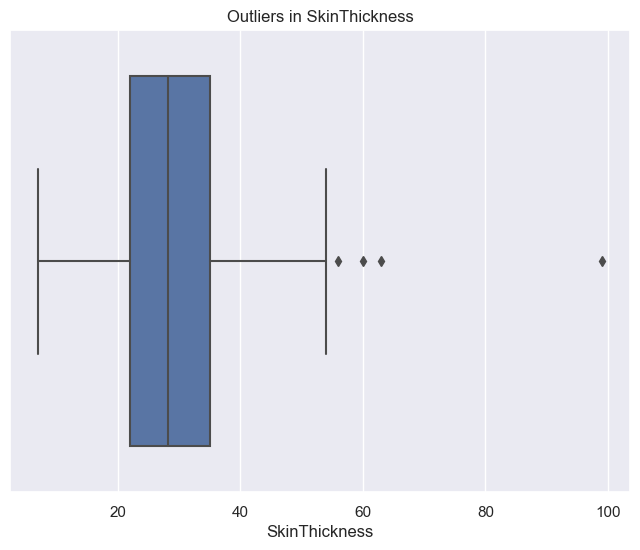

SkinThickness True


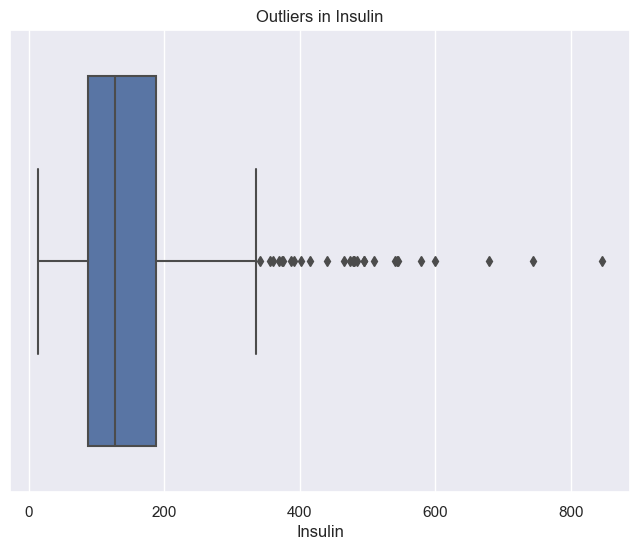

Insulin True
BMI False
DiabetesPedigreeFunction False
Age False
Outcome False


In [49]:
for col in df.columns:
    print(col, check_outlier(df, col, plot=True))
    if check_outlier(df, col):
        replace_with_thresholds(df, col)

### Feature Extraction

In [50]:
# Create Age category

df.loc[(df["Age"] >= 21) & (df["Age"] < 30), "NEW_AGE_CAT"] = "Young Adult"
df.loc[(df["Age"] >= 30) & (df["Age"] < 60), "NEW_AGE_CAT"] = "Adult"
df.loc[(df["Age"] >= 60), "NEW_AGE_CAT"] = "Senior"

In [51]:
# Create BMI Category
### BMI below 18.5 = underweight, between 18.5 and 24.9 = normal, between 24.9 and 29.9 = overweight and above 30 = obese

df['NEW_BMI'] = pd.cut(x=df['BMI'], bins=[0, 18.5, 24.9, 29.9, 100],labels=["Underweight", "Healthy", "Overweight", "Obese"])

In [52]:
# Create Glucose Category

df["NEW_GLUCOSE"] = pd.cut(x=df["Glucose"], bins=[0, 140, 200, 300], labels=["Normal", "Prediabetes", "Diabetes"])

In [53]:
# Crate Insulin Category

def set_insulin(dataframe, col_name="Insulin"):
    if 16 <= dataframe[col_name] <= 166:
        return "Normal"
    else:
        return "Abnormal"

df["NEW_INSULIN_SCORE"] = df.apply(set_insulin, axis=1)
df["NEW_GLUCOSE_INSULIN"] = df["Glucose"] * df["Insulin"]

In [54]:
df["NEW_GLUCOSE_PREGNANCIES"] = df["Glucose"] * df["Pregnancies"]

In [55]:
df.columns = [col.upper() for col in df.columns]
df.head()

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_AGE_CAT,NEW_BMI,NEW_GLUCOSE,NEW_INSULIN_SCORE,NEW_GLUCOSE_INSULIN,NEW_GLUCOSE_PREGNANCIES
0,6,148.000,72.000,35.000,196.000,33.600,0.627,50,1,Adult,Obese,Prediabetes,Abnormal,29008.000,888.000
1,1,85.000,66.000,29.000,73.600,26.600,0.351,31,0,Adult,Overweight,Normal,Normal,6256.000,85.000
2,8,183.000,64.000,25.600,218.200,23.300,0.672,32,1,Adult,Healthy,Prediabetes,Abnormal,39930.600,1464.000
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0,Young Adult,Overweight,Normal,Normal,8366.000,89.000
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1,Adult,Obese,Normal,Abnormal,23016.000,0.000


In [56]:
categorical_cols = ['NEW_AGE_CAT', 'NEW_BMI', 'NEW_GLUCOSE', 'NEW_INSULIN_SCORE']
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

In [57]:
df.head()

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_GLUCOSE_INSULIN,NEW_GLUCOSE_PREGNANCIES,NEW_AGE_CAT_Senior,NEW_AGE_CAT_Young Adult,NEW_BMI_Healthy,NEW_BMI_Overweight,NEW_BMI_Obese,NEW_GLUCOSE_Prediabetes,NEW_GLUCOSE_Diabetes,NEW_INSULIN_SCORE_Normal
0,6,148.000,72.000,35.000,196.000,33.600,0.627,50,1,29008.000,888.000,0,0,0,0,1,1,0,0
1,1,85.000,66.000,29.000,73.600,26.600,0.351,31,0,6256.000,85.000,0,0,0,1,0,0,0,1
2,8,183.000,64.000,25.600,218.200,23.300,0.672,32,1,39930.600,1464.000,0,0,1,0,0,1,0,0
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0,8366.000,89.000,0,1,0,1,0,0,0,1
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1,23016.000,0.000,0,0,0,0,1,0,0,0


In [58]:
numerical_cols = ['PREGNANCIES', 'GLUCOSE', 'BLOODPRESSURE', 'SKINTHICKNESS', 'INSULIN', 'BMI', 'DIABETESPEDIGREEFUNCTION', 'AGE', 'NEW_GLUCOSE_INSULIN', 'NEW_GLUCOSE_PREGNANCIES']
scaler = RobustScaler()

In [59]:
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

In [60]:
df.head(10)

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_GLUCOSE_INSULIN,NEW_GLUCOSE_PREGNANCIES,NEW_AGE_CAT_Senior,NEW_AGE_CAT_Young Adult,NEW_BMI_Healthy,NEW_BMI_Overweight,NEW_BMI_Obese,NEW_GLUCOSE_Prediabetes,NEW_GLUCOSE_Diabetes,NEW_INSULIN_SCORE_Normal
0,0.600,0.765,0.000,0.523,0.680,0.159,0.665,1.235,1,0.847,0.907,0,0,0,0,1,1,0,0
1,-0.400,-0.790,-0.375,0.062,-0.541,-0.610,-0.056,0.118,0,-0.535,-0.421,0,0,0,1,0,0,0,1
2,1.000,1.630,-0.500,-0.200,0.902,-0.973,0.783,0.176,1,1.510,1.859,0,0,1,0,0,1,0,0
3,-0.400,-0.691,-0.375,-0.400,-0.337,-0.445,-0.537,-0.471,0,-0.407,-0.414,0,1,0,1,0,0,0,1
4,-0.600,0.494,-2.000,0.523,0.401,1.203,5.008,0.235,1,0.483,-0.561,0,0,0,0,1,0,0,0
5,0.400,-0.025,0.125,-0.308,-0.427,-0.720,-0.448,0.059,0,-0.316,0.398,0,0,0,1,0,0,0,1
6,0.000,-0.963,-1.375,0.292,-0.397,-0.126,-0.325,-0.176,1,-0.498,-0.174,0,1,0,0,1,0,0,1
7,1.400,-0.049,-0.162,0.646,-0.046,0.346,-0.624,0.000,0,-0.054,1.340,0,1,0,0,1,0,0,1
8,-0.200,1.975,-0.125,1.292,4.142,-0.181,-0.561,1.412,1,5.582,0.090,0,0,0,0,1,1,0,0
9,1.000,0.198,1.500,0.923,0.357,-0.115,-0.367,1.471,1,0.327,1.092,0,0,0,0,1,0,0,1


## Model Building After Feature Engineering

In [61]:
# Dependent/target variable
y = df["OUTCOME"]

# Independent/explanatory variables
X = df.drop("OUTCOME", axis=1)

# Splitting into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=5)

### Logistic Regression

In [62]:
lr_model = LogisticRegression(random_state=100).fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)

In [63]:
print("-----Logistic Regression-----")
print(f"Accuracy: {round(accuracy_score(lr_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(lr_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(lr_pred, y_test), 4)}")
print(f"F1: {round(f1_score(lr_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(lr_pred, y_test), 4)}")

-----Logistic Regression-----
Accuracy: 0.8117
Recall: 0.7778
Precision: 0.6481
F1: 0.7071
AUC: 0.8017


#### Hyperparameter Optimization

In [64]:
lr_model = LogisticRegression(random_state=100)
parameters = {'C': [0.1, 1, 10],
              'penalty': ['l1', 'l2']}
lr_grid = GridSearchCV(lr_model, parameters, cv=5).fit(X_train, y_train)

best_lr_model = lr_grid.best_estimator_

In [65]:
lr_acc = lr_grid.best_score_
lr_recall = recall_score(best_lr_model.predict(X_test), y_test)
lr_precision = precision_score(best_lr_model.predict(X_test), y_test)
lr_f1 = f1_score(best_lr_model.predict(X_test), y_test)
lr_auc = roc_auc_score(best_lr_model.predict(X_test), y_test)

In [66]:
print("-----Logistic Regression * Hyperparameter Optimization-----")
print(f"Best Parameters: {lr_grid.best_params_}")
print(f"Accuracy: {round(lr_acc, 4)}")
print(f"Recall: {round(lr_recall, 4)}")
print(f"Precision: {round(lr_precision, 4)}")
print(f"F1: {round(lr_f1, 4)}")
print(f"AUC: {round(lr_auc, 4)}")

-----Logistic Regression * Hyperparameter Optimization-----
Best Parameters: {'C': 1, 'penalty': 'l2'}
Accuracy: 0.7687
Recall: 0.7778
Precision: 0.6481
F1: 0.7071
AUC: 0.8017


### K-Nearest Neighbors (KNN)

In [67]:
knn_model = KNeighborsClassifier().fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)

In [68]:
print("-----K-Nearest Neighbors (KNN)-----")
print(f"Accuracy: {round(accuracy_score(knn_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(knn_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(knn_pred, y_test), 4)}")
print(f"F1: {round(f1_score(knn_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(knn_pred, y_test), 4)}")

-----K-Nearest Neighbors (KNN)-----
Accuracy: 0.7727
Recall: 0.6792
Precision: 0.6667
F1: 0.6729
AUC: 0.7505


#### Hyperparameter Optimization

In [69]:
knn_model = KNeighborsClassifier()
parameters = {'n_neighbors': [5, 10, 15],
              'weights': ['uniform', 'distance']}
knn_grid = GridSearchCV(knn_model, parameters, cv=5).fit(X_train, y_train)

best_knn_model = knn_grid.best_estimator_

In [70]:
knn_acc = knn_grid.best_score_
knn_recall = recall_score(best_knn_model.predict(X_test), y_test)
knn_precision = precision_score(best_knn_model.predict(X_test), y_test)
knn_f1 = f1_score(best_knn_model.predict(X_test), y_test)
knn_auc = roc_auc_score(best_knn_model.predict(X_test), y_test)

In [71]:
print("-----K-Nearest Neighbors (KNN) * Hyperparameter Optimization-----")
print(f"Best Parameters: {knn_grid.best_params_}")
print(f"Accuracy: {round(knn_acc, 4)}")
print(f"Recall: {round(knn_recall, 4)}")
print(f"Precision: {round(knn_precision, 4)}")
print(f"F1: {round(knn_f1, 4)}")
print(f"AUC: {round(knn_auc, 4)}")

-----K-Nearest Neighbors (KNN) * Hyperparameter Optimization-----
Best Parameters: {'n_neighbors': 10, 'weights': 'distance'}
Accuracy: 0.7639
Recall: 0.7021
Precision: 0.6111
F1: 0.6535
AUC: 0.7529


### Decision Tree Classifier

In [72]:
dt_model = DecisionTreeClassifier(random_state=100).fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)

In [73]:
print("-----Decision Tree Classifier-----")
print(f"Accuracy: {round(accuracy_score(dt_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(dt_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(dt_pred, y_test), 4)}")
print(f"F1: {round(f1_score(dt_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(dt_pred, y_test), 4)}")

-----Decision Tree Classifier-----
Accuracy: 0.7403
Recall: 0.64
Precision: 0.5926
F1: 0.6154
AUC: 0.7142


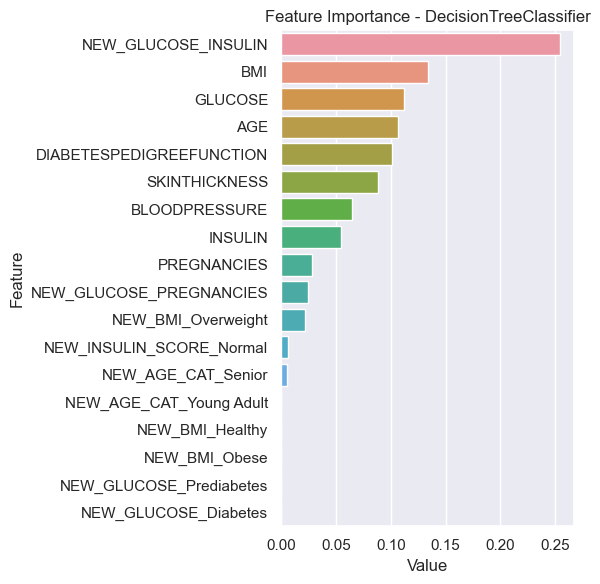

In [74]:
feature_imp = pd.DataFrame({'Value': dt_model.feature_importances_, 'Feature': X.columns})
plt.figure(figsize=(6, 6))
sns.set(font_scale=1)
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:len(X)])
plt.title(f'Feature Importance - {dt_model.__class__.__name__}')
plt.tight_layout()
plt.show()

#### Hyperparameter Optimization

In [75]:
dt_model = DecisionTreeClassifier(random_state=100)
parameters = {'max_depth': [3, 5, 10],
              'min_samples_split': [5, 10, 15]}
dt_grid = GridSearchCV(dt_model, parameters, cv=5).fit(X_train, y_train)

best_dt_model = dt_grid.best_estimator_

In [76]:
dt_acc = dt_grid.best_score_
dt_recall = recall_score(best_dt_model.predict(X_test), y_test)
dt_precision = precision_score(best_dt_model.predict(X_test), y_test)
dt_f1 = f1_score(best_dt_model.predict(X_test), y_test)
dt_auc = roc_auc_score(best_dt_model.predict(X_test), y_test)

In [77]:
print("-----Decision Tree Classifier * Hyperparameter Optimization-----")
print(f"Best Parameters: {dt_grid.best_params_}")
print(f"Accuracy: {round(dt_acc, 4)}")
print(f"Recall: {round(dt_recall, 4)}")
print(f"Precision: {round(dt_precision, 4)}")
print(f"F1: {round(dt_f1, 4)}")
print(f"AUC: {round(dt_auc, 4)}")

-----Decision Tree Classifier * Hyperparameter Optimization-----
Best Parameters: {'max_depth': 3, 'min_samples_split': 5}
Accuracy: 0.7296
Recall: 0.75
Precision: 0.6111
F1: 0.6735
AUC: 0.7795


### Random Forest Classifier

In [78]:
rf_model = RandomForestClassifier(random_state=100).fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

In [79]:
print("-----RandomForestClassifier-----")
print(f"Accuracy: {round(accuracy_score(y_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(y_pred,y_test),4)}")
print(f"Precision: {round(precision_score(y_pred,y_test), 4)}")
print(f"F1: {round(f1_score(y_pred,y_test), 4)}")
print(f"Auc: {round(roc_auc_score(y_pred,y_test), 4)}")

-----RandomForestClassifier-----
Accuracy: 0.7857
Recall: 0.7234
Precision: 0.6296
F1: 0.6733
Auc: 0.7682


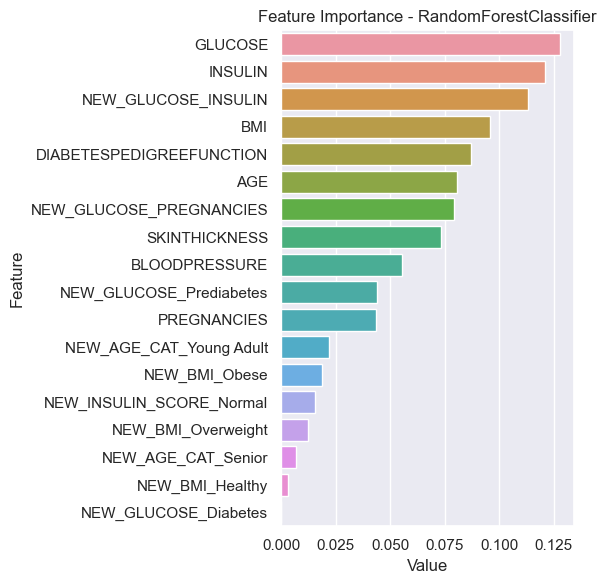

In [80]:
feature_imp = pd.DataFrame({'Value': rf_model.feature_importances_, 'Feature': X.columns})
plt.figure(figsize=(6, 6))
sns.set(font_scale=1)
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:len(X)])
plt.title(f'Feature Importance - {rf_model.__class__.__name__}')
plt.tight_layout()
plt.show()

#### Hyperparameter Optimization

In [81]:
rf_model = RandomForestClassifier(random_state=100)
parameters = {'n_estimators': [100, 200, 300],
              'max_depth': [3, 10, 15],
              'min_samples_split': [5, 10, 15]}
rf_grid = GridSearchCV(rf_model, parameters, cv=5).fit(X_train, y_train)

best_rf_model = rf_grid.best_estimator_

In [82]:
rf_acc = rf_grid.best_score_
rf_recall = recall_score(best_rf_model.predict(X_test), y_test)
rf_precision = precision_score(best_rf_model.predict(X_test), y_test)
rf_f1 = f1_score(best_rf_model.predict(X_test), y_test)
rf_auc = roc_auc_score(best_rf_model.predict(X_test), y_test)

In [83]:
print("-----Random Forest Classifier * Hyperparameter Optimization-----")
print(f"Best Parameters: {rf_grid.best_params_}")
print(f"Accuracy: {round(rf_acc, 4)}")
print(f"Recall: {round(rf_recall, 4)}")
print(f"Precision: {round(rf_precision, 4)}")
print(f"F1: {round(rf_f1, 4)}")
print(f"AUC: {round(rf_auc, 4)}")

-----Random Forest Classifier * Hyperparameter Optimization-----
Best Parameters: {'max_depth': 15, 'min_samples_split': 10, 'n_estimators': 100}
Accuracy: 0.7703
Recall: 0.7447
Precision: 0.6481
F1: 0.6931
AUC: 0.7836


### Support Vector Classifier (SVC)

In [84]:
svc_model = SVC(random_state=10).fit(X_train, y_train)
svc_pred = svc_model.predict(X_test)

In [85]:
print("-----Support Vector Classifier (SVC)-----")
print(f"Accuracy: {round(accuracy_score(svc_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(svc_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(svc_pred, y_test), 4)}")
print(f"F1: {round(f1_score(svc_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(svc_pred, y_test), 4)}")

-----Support Vector Classifier (SVC)-----
Accuracy: 0.7922
Recall: 0.7391
Precision: 0.6296
F1: 0.68
AUC: 0.777


#### Hyperparameter Optimization

In [86]:
svc_model = SVC(random_state=100)
parameters = {'C': [0.1, 1, 10],
              'kernel': ['linear', 'rbf']}
svc_grid = GridSearchCV(svc_model, parameters, cv=5).fit(X_train, y_train)

best_svc_model = svc_grid.best_estimator_

In [87]:
svc_acc = svc_grid.best_score_
svc_recall = recall_score(best_svc_model.predict(X_test), y_test)
svc_precision = precision_score(best_svc_model.predict(X_test), y_test)
svc_f1 = f1_score(best_svc_model.predict(X_test), y_test)
svc_auc = roc_auc_score(best_svc_model.predict(X_test), y_test)

In [88]:
print("-----Support Vector Classifier (SVC) * Hyperparameter Optimization-----")
print(f"Best Parameters: {svc_grid.best_params_}")
print(f"Accuracy: {round(svc_acc, 4)}")
print(f"Recall: {round(svc_recall, 4)}")
print(f"Precision: {round(svc_precision, 4)}")
print(f"F1: {round(svc_f1, 4)}")
print(f"AUC: {round(svc_auc, 4)}")

-----Support Vector Classifier (SVC) * Hyperparameter Optimization-----
Best Parameters: {'C': 0.1, 'kernel': 'linear'}
Accuracy: 0.7671
Recall: 0.7447
Precision: 0.6481
F1: 0.6931
AUC: 0.7836


In [89]:
metrics = {
    "Model": ["Logistic Regression", "KNN", "Decision Tree", "Random Forest", "SVC"],
    "Accuracy": [lr_acc, knn_acc, dt_acc, rf_acc, svc_acc],
    "Recall": [lr_recall, knn_recall, dt_recall, rf_recall, svc_recall],
    "Precision": [lr_precision, knn_precision, dt_precision, rf_precision, svc_precision],
    "F1": [lr_f1, knn_f1, dt_f1, rf_f1, svc_f1],
    "AUC": [lr_auc, knn_auc, dt_auc, rf_auc, svc_auc]
}

results_df = pd.DataFrame(metrics)

results_df = results_df.sort_values(by="Accuracy", ascending=False)

fig = go.Figure()

colors = ["maroon", "darkorange", "purple", "teal", "navy"]

for metric, color in zip(["Accuracy", "Recall", "Precision", "F1", "AUC"], colors):
    fig.add_trace(go.Bar(
        x=results_df["Model"],
        y=results_df[metric],
        marker_color=color,
        text=round(results_df[metric],2),
        name=metric,
        textposition='auto'
    ))

fig.update_layout(
    yaxis_title="Metric Value",
    title="Metrics Comparison for Different Models After Hyperparameter Optimization"
)

fig.show()